In [3]:
from google.colab import files
files.upload()

Saving Faces.zip to Faces.zip


{'Faces.zip': b'PK\x03\x04\x14\x00\x00\x00\x00\x00h\nT\\\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00 \x00Faces/ux\x0b\x00\x01\x04\x00\x00\x00\x00\x04\x00\x00\x00\x00UT\r\x00\x07=i\x97iJq\x97i\ti\x97iPK\x03\x04\x14\x00\x00\x00\x00\x00x\x0bT\\\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00 \x00Faces/angry/ux\x0b\x00\x01\x04\x00\x00\x00\x00\x04\x00\x00\x00\x00UT\r\x00\x07=k\x97iJq\x97i\ti\x97iPK\x03\x04\x14\x00\x08\x00\x08\x00O\nT\\\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00 \x00Faces/angry/PublicTest_50685895.jpgux\x0b\x00\x01\x04\x00\x00\x00\x00\x04\x00\x00\x00\x00UT\r\x00\x07\x0ei\x97i)k\x97it\xee\x13_\x01R\x06\xad\xf9\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x02\x01\x01\x01\x01\x01\x02\x01\x01\x01\x02\x02\x02\x02\x02\x04\x03\x02\x02\x02\x02\x05\x04\x04\x03\x04\x06\x05\x06\x06\x06\x05\x06\x06\x06\x07\t\x08\x06\x07\t\x07\x06\x06\x08\x0b\x08\t\n\n\n\n\n\x06\x08\x0b\x0c\x0b\n\x0c\t\n\n\n\xff\xc0\x00\x0b\x08\x000\x0

In [4]:
!unzip Faces.zip
!ls

Archive:  Faces.zip
   creating: Faces/
   creating: Faces/angry/
  inflating: Faces/angry/PublicTest_50685895.jpg  
  inflating: Faces/angry/PublicTest_50984559.jpg  
  inflating: Faces/angry/PublicTest_51044199.jpg  
  inflating: Faces/angry/PublicTest_51080774.jpg  
  inflating: Faces/angry/PublicTest_51099854.jpg  
  inflating: Faces/angry/PublicTest_51144645.jpg  
  inflating: Faces/angry/PublicTest_52070065.jpg  
  inflating: Faces/angry/PublicTest_52439734.jpg  
  inflating: Faces/angry/PublicTest_52681031.jpg  
  inflating: Faces/angry/PublicTest_52706232.jpg  
  inflating: Faces/angry/PublicTest_52739184.jpg  
  inflating: Faces/angry/PublicTest_53367661.jpg  
  inflating: Faces/angry/PublicTest_53480653.jpg  
  inflating: Faces/angry/PublicTest_53519543.jpg  
  inflating: Faces/angry/PublicTest_54144300.jpg  
  inflating: Faces/angry/PublicTest_54146920.jpg  
  inflating: Faces/angry/PublicTest_54462619.jpg  
  inflating: Faces/angry/PublicTest_54630431.jpg  
  inflating: Fac

In [5]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

In [9]:
DATASET_PATH = "Faces"
IMG_SIZE = 48
BATCH_SIZE = 64
EPOCHS = 40

In [10]:
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=10,
    zoom_range=0.1,
    horizontal_flip=True
)

train_gen = datagen.flow_from_directory(
    DATASET_PATH,
    target_size=(IMG_SIZE, IMG_SIZE),
    color_mode="grayscale",
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    subset="training",
    shuffle=True
)

val_gen = datagen.flow_from_directory(
    DATASET_PATH,
    target_size=(IMG_SIZE, IMG_SIZE),
    color_mode="grayscale",
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    subset="validation",
    shuffle=False
)

num_classes = train_gen.num_classes
print("Classes:", train_gen.class_indices)

Found 1229 images belonging to 7 classes.
Found 306 images belonging to 7 classes.
Classes: {'angry': 0, 'disgust': 1, 'fear': 2, 'happy': 3, 'neutral': 4, 'sad': 5, 'surprise': 6}


In [11]:
model = Sequential()

model.add(Conv2D(32, (3,3), activation="relu", input_shape=(48,48,1)))
model.add(MaxPooling2D(2,2))

model.add(Conv2D(64, (3,3), activation="relu"))
model.add(MaxPooling2D(2,2))

model.add(Conv2D(128, (3,3), activation="relu"))
model.add(MaxPooling2D(2,2))

model.add(Flatten())

model.add(Dense(256, activation="relu"))
model.add(Dropout(0.4))

model.add(Dense(num_classes, activation="softmax"))

model.compile(
    optimizer="adam",
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 46, 46, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 23, 23, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 21, 21, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 10, 10, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 8, 8, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 7)              │         1,799 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 619,015 (2.36 MB)

 Trainable params: 619,015 (2.36 MB)

 Non-trainable params: 0 (0.00 B)

In [12]:
early_stop = EarlyStopping(
    monitor="val_loss",
    patience=7,
    restore_best_weights=True
)

history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=EPOCHS,
    callbacks=[early_stop]
)

Epoch 1/40


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 243ms/step - accuracy: 0.1344 - loss: 1.9466 - val_accuracy: 0.1732 - val_loss: 1.9187
Epoch 2/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.1532 - loss: 1.9325 - val_accuracy: 0.1601 - val_loss: 1.9177
Epoch 3/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - accuracy: 0.1673 - loss: 1.9256 - val_accuracy: 0.1601 - val_loss: 1.9239
Epoch 4/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.1765 - loss: 1.9249 - val_accuracy: 0.1601 - val_loss: 1.9096
Epoch 5/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.1706 - loss: 1.9059 - val_accuracy: 0.1895 - val_loss: 1.9000
Epoch 6/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.2307 - loss: 1.8887 - val_accuracy: 0.2255 - val_loss: 1.8825
Epoch 7/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - accuracy: 0.2137 - loss: 1.8787 - val_accuracy: 0.2516 - val_loss: 1.8483
Epoch 8/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.2392 - loss: 1.8572 - val_accuracy: 0.2582 - val_loss: 

In [15]:
model.save("emotion_model.keras")


In [17]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]

tflite_model = converter.convert()

with open("emotion_model.tflite", "wb") as f:
    f.write(tflite_model)

print("✅ Model exported as emotion_model.tflite")


Saved artifact at '/tmp/tmprp41n_zx'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 48, 48, 1), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 7), dtype=tf.float32, name=None)
Captures:
  139792533179472: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139792533180624: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139792533179280: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139792533178512: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139792533183120: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139792533183888: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139792533182544: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139792533184080: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139792533182160: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139792533182736: TensorSpec(shape=(), dtype=tf.resource, name=None)
✅ Model exported a

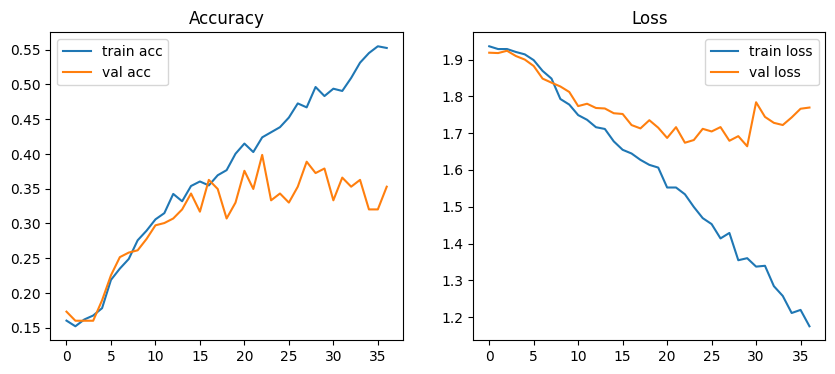

In [18]:
plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.plot(history.history["accuracy"], label="train acc")
plt.plot(history.history["val_accuracy"], label="val acc")
plt.legend()
plt.title("Accuracy")

plt.subplot(1,2,2)
plt.plot(history.history["loss"], label="train loss")
plt.plot(history.history["val_loss"], label="val loss")
plt.legend()
plt.title("Loss")

plt.show()

In [20]:
model.save(r"C:\MAITRI SAMPLE VER\emotion_model.keras")

print("✅ Model saved in C:\\MAITRI SAMPLE VER\\emotion_model.keras")


✅ Model saved in C:\MAITRI SAMPLE VER\emotion_model.keras


In [21]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]

tflite_model = converter.convert()

with open(r"C:\MAITRI SAMPLE VER\emotion_model.tflite", "wb") as f:
    f.write(tflite_model)

print("✅ TFLite saved in C:\\MAITRI SAMPLE VER\\emotion_model.tflite")


Saved artifact at '/tmp/tmppru5baa1'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 48, 48, 1), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 7), dtype=tf.float32, name=None)
Captures:
  139792533179472: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139792533180624: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139792533179280: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139792533178512: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139792533183120: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139792533183888: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139792533182544: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139792533184080: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139792533182160: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139792533182736: TensorSpec(shape=(), dtype=tf.resource, name=None)
✅ TFLite saved in 

In [22]:
from google.colab import files

files.download(r"C:\MAITRI SAMPLE VER\emotion_model.tflite")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>